## Sentiment Analysis in the Context of Disaster Responses

<!--##### Why sentiment analysis in disaster response?

 - **Rapid assessment of public sentiment**: Sentiment analysis can be used to quickly analyze large amounts of social media data to get a sense of the public's mood and opinions during a disaster. This information can help disaster response teams understand the public's needs, concerns, and expectations, and tailor their response accordingly.

- Early warning systems: Sentiment analysis can be used to **detect changes in public sentiment** that may indicate an impending disaster. For example, a sudden spike in negative sentiment about a particular location may indicate a developing crisis, allowing disaster response teams to respond proactively.

- Identification of **critical information**: Sentiment analysis can help disaster response teams quickly identify the most critical information from social media data. For example, the sentiment of tweets about a particular location can be analyzed to determine which tweets contain important information about the situation on the ground.

- **Improved communication**: Sentiment analysis can be used to **monitor the public's reaction to disaster response efforts** and communicate with them more effectively. For example, sentiment analysis can be used to monitor public sentiment towards evacuation orders or to provide real-time updates on the disaster response efforts. -->

##### "Requirements" for a Sentiment Analysis Methodology for Disaster Response

To create a reliable "pipeline" that can be meaningful in the applied context of a disaster response:

1. An appropriate methodology
    - Which is the best methodology for our use-cases? What characteristics are to be prioritised to fit the needs?
    - An experimentation phase will likely be required. That phase will include both method and dataset testing 
    - Open quesion: Use what is "out there" and construct a pipeline approach for disaster datasets (from input CSV to output spaital analyis) or research model optimisation? Probably a question of resources.

2. Training datasets
    - Scarce availability of disaster-related datasets
    - Option of "rehydrating" tweet_ids, but less than 50% are actually retrievable
    - Depending on aims: multi-lingual? English? Multimodal? 
    - Own dataset annotation?
    
2. A "standardised" spatial and temporal analysis method should be assembled
    - Hotspot analysis
    - Trends over time

3. Fast output generation (template-based?)


<br>


##### (A Few) Methods

Model comparisons should be expanded, but also purposefully chosen.

In [330]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import seaborn as sns

perf = pd.read_csv('../Data/perfromances.csv')
perf = perf.rename(columns={'Unnamed: 0': 'Models'})
#cm = sns.light_palette("blue", as_cmap=True)
cm = sns.color_palette("ch:start=.2,rot=-.3", as_cmap=True)


perf.style.background_gradient(cmap=cm).format(precision=2)


,Models,Precision,Recall,Accuracy,F1
0,SentiWordNet,0.50,0.50,0.48,0.46
1,VADER,0.67,0.64,0.64,0.64
2,Naive Bayes,0.80,0.79,0.79,0.79
3,SVM,0.88,0.88,0.88,0.88
4,RoBERTa,0.71,0.73,0.71,0.71
5,BERTweet,0.71,0.72,0.70,0.71
6,Fine Tuned BERT,0.78,0.78,0.78,0.78


##### Datasets

A start...

| # | Name | Size | Labels | Twitter Data | Natural Disaster Related | Link |
|---|------|------|----------|:--------------:|:-----:|-----|
| 1 | Sentiment140| 1.6m| neg, neu, pos| ✔ |  | [link](https://www.kaggle.com/datasets/kazanova/sentiment140) |
| 2 | Twitter US Airline Sentiment| 55K |neg, neu, pos | ✔ | | [link](https://raw.githubusercontent.com/ashutoshmakone/Twitter-US-Airline-Sentiment-classification/main/Dataset/Tweets.csv) |
| 3 | SemEval-2015 Task 10: Sentiment Analysis in Twitter|3097 | neg, neu, pos | ✔ | | [link](https://alt.qcri.org/semeval2015/task10/index.php?id=data-and-tools)|
| 4 | SemEval-2016 Task 4: Sentiment Analysis in Twitter| 10K| neg, neu, pos| ✔ | |[link](https://alt.qcri.org/semeval2016/task4/index.php?id=data-and-tools) |
| 4 | SemEval-2016 Task 5: Aspect-Based Sentiment Analysis| 10K| entity, attribute, pos, neu, neg, target | ✔ | |[link](https://alt.qcri.org/semeval2016/task4/index.php?id=data-and-tools) |
| 5 |SemEval-2017 Task 4: Sentiment Analysis in Twitter| |neg, neu, pos | ✔ | |[link](https://alt.qcri.org/semeval2017/task4/index.php?id=data-and-tools)|
| 6 | SemEval-2018 Task 1: Affect in Tweets|7K | joy, fear, anger, sadness | ✔| |[link](https://competitions.codalab.org/competitions/17751#learn_the_details-datasets)|
| 7 | The Sanders Twitter Corpus| 5K|neg, neu, pos, irrelevant |✔ | | [link](https://github.com/zfz/twitter_corpus) |
| 8 | The CrisisNLP datasets | varied (multiple case studies) | diverse | ✔ | ✔ | [link](https://crisisnlp.qcri.org/) |
| 9 | TBCOV: Two Billion Multilingual COVID-19 Tweets with Sentiment, Entity, Geo, and Gender Labels | 2b| neg, neu, pos| ✔ | |[link](https://crisisnlp.qcri.org/tbcov) |
| 10 | Natural Hazards Twitter Dataset | 40K | pos, neg | ✔ | ✔ |[link](https://github.com/Dong-UTIL/Natural-Hazards-Twitter-Dataset) |
| 11 | HurricaneEmo | 15K | aggressiveness, optimism, love, submission, awe, disapproval, remorse, contempt |✔ |✔|[link](https://github.com/shreydesai/hurricane) |
| 12 | SMILE Twitter Emotion dataset|3,085 |anger, disgust, happiness, surprise and sadness | ✔ | | [link](https://www.kaggle.com/datasets/ashkhagan/smile-twitter-emotion-dataset?resource=download) |
| 13 |Emotion Dataset for Emotion Recognition Tasks | ~18K | joy, sadness, anger, fear, love, surprise|✔| | [link](https://github.com/dair-ai/emotion_dataset) |
|14 |Twitter Reviews for Emotion Analysis|~10K|Happy, Sad, Surprise, Fear, Disgust, Angry|✔||[link](https://www.kaggle.com/datasets/shainy/twitter-reviews-for-emotion-analysis?select=data.csv)|

<hr>
<!-- <img src="https://www.gadget-cover.com/media/1217/premium-handsets.jpg" align="right" width="30%"> -->
<img src="https://img.freepik.com/premium-photo/vertical-photo-multiethnic-group-students-using-cell-phone-laughing-teenagers-using-sm_325573-765.jpg" align="right" width="25%">

##### In everyday life... 

<img src="https://www.torqlite.com/wp-content/uploads/2017/02/60414c58e954d7236837248225e0216f_new-twitter-logo-vector-eps-twitter-logo-clipart_518-518.png" align="left" width="25px"> 
<i>"Been trying to clear out my left ear with peroxide for the last 3 hours. This shit is bananas. I hate not being able to hear"</i>
<br>
<br>

<img src="https://www.torqlite.com/wp-content/uploads/2017/02/60414c58e954d7236837248225e0216f_new-twitter-logo-vector-eps-twitter-logo-clipart_518-518.png" align="left" width="25px"> 
<i>"Manchester United confirms that Carlos Tevez is leaving the club... so sad"</i>
<br>
<br>

<img src="https://www.torqlite.com/wp-content/uploads/2017/02/60414c58e954d7236837248225e0216f_new-twitter-logo-vector-eps-twitter-logo-clipart_518-518.png" align="left" width="25px"> 
<i>I wanna do something fun but have no clue what to do. Tre sleep & @krob5858 is taking a nap. So its just me</i>
<br>
<br>
<br>

<!-- _[Sentiment140 dataset with 1.6 million tweets: [see dataest](https://www.kaggle.com/datasets/kazanova/sentiment140?resource=download)]_ -->
_[Twitter Sentiment dataset with 30K tweets: [see dataest](https://www.kaggle.com/datasets/yasserh/twitter-tweets-sentiment-dataset)]_

In [98]:
#import tensorflow as tf
import torch
from transformers import AutoModelForSequenceClassification
from transformers import TFAutoModelForSequenceClassification
from transformers import AutoTokenizer, AutoConfig, AutoTokenizer, AutoModel
from pysentimiento import create_analyzer
from pysentimiento.preprocessing import preprocess_tweet as bertweetpreprocess
import fastai
from datasets import load_dataset

import numpy as np
from scipy.special import softmax
import csv
import urllib.request
import pandas as pd                                                    # for data handling
import xml.etree.cElementTree as ET                                    # for parsing XML file

import matplotlib.pyplot as plt
%matplotlib inline

import mapclassify                                                     # required for animated scatterplot map (plotly)
import geopandas as gpd                                                # geographic data handling
import folium                                                          # interactive mapping capabilities
import folium.plugins as plugins
import plpygis                                                         # a converter to and from the PostGIS geometry types, WKB, GeoJSON and Shapely formats
from plpygis import Geometry
from shapely.geometry import Point, Polygon, shape                     # creating geospatial data
from shapely import wkb, wkt                                           # creating and parsing geospatial data
import shapely        

import pysal
from pysal.lib import weights
import seaborn as sns
sns.set_style("darkgrid")

import plotly
import plotly.express as px                                            # for interactive, animated timeseries map
import seaborn as sns; sns.set(style="ticks", color_codes=True)
# import json

from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS
from PIL import Image    # for masking wordcloud with an image
import requests          # for accessing url image
from io import BytesIO   # for accedssing url image

In [114]:
normal_tweets = pd.read_csv("../Data/Disaster_responses/Tweets.csv", encoding='utf8')
normal_tweets['text'] = normal_tweets['text'].astype(str)

#30K
# normal_tweets = normal_tweet.sample(50000)
normal_tweets['label'] = [1 if value == 'positive' else -1 if value == 'negative' else 0 for value in normal_tweets['sentiment']]
show = normal_tweets[['text', 'label', 'sentiment']]
show.sample(5).style.set_properties(**{'text-align': 'left'}).set_table_styles([dict(selector = 'th', props=[('text-align', 'left')])])


,text,label,sentiment
23967,(Raises hand) Oh! Oh! Me too! #caffeine,0,neutral
20020,Aaaaw no! Are the windows open and that?,-1,negative
11370,That`s the song I mean,0,neutral
9972,O dear. so you`re going to be **** that kiddoe and I`m going to sit there doing.. nothing! awesome WHERES THE SHOPPING?!<3,-1,negative
13640,"heh, i meant differences between b3 and b4",0,neutral


<hr>
<!-- <img src="https://cdn.cnn.com/cnnnext/dam/assets/170828070646-62b-hurricane-harvey-0827-full-169.jpg" align="right" width="40%"> -->
<img src="https://archive.internationalrivers.org/sites/default/files/images/book/lori_pottinger/floodednorleansvertical.jpg" align="right" width="40%">

##### In a disaster... 

<img src="https://www.torqlite.com/wp-content/uploads/2017/02/60414c58e954d7236837248225e0216f_new-twitter-logo-vector-eps-twitter-logo-clipart_518-518.png" align="left" width="25px"> 
<i>"Hope the people there are in a safe location and help reaches those in need during Hurricane Harvey. #prayfortexas"</i>

<br>
<br>

<img src="https://www.torqlite.com/wp-content/uploads/2017/02/60414c58e954d7236837248225e0216f_new-twitter-logo-vector-eps-twitter-logo-clipart_518-518.png" align="left" width="25px"> 
<i>"And the president pardons him on Friday during the prime of tropical storm Harvey."</i>

<br>
<br>

<img src="https://www.torqlite.com/wp-content/uploads/2017/02/60414c58e954d7236837248225e0216f_new-twitter-logo-vector-eps-twitter-logo-clipart_518-518.png" align="left" width="25px"> 
<i>"Our View: Hurricane Harvey proves we can still save each other"</i>

<br>
<br>

<img src="https://www.torqlite.com/wp-content/uploads/2017/02/60414c58e954d7236837248225e0216f_new-twitter-logo-vector-eps-twitter-logo-clipart_518-518.png" align="left" width="25px"> 
<i>"Still looking for an answer for power outages due to hurricane Harvey. I can have the best internet connection but no power = no sling"</i>

<br>
<br>



There's a scarcity of sentiment labelled twitter datasets. This one is derived from [The Climate Change Twitter Dataset](https://www.kaggle.com/datasets/deffro/the-climate-change-twitter-dataset):

In [19]:
import pandas as pd
disasters = pd.read_csv("../Data/Disaster_responses/The Climate Change Twitter Dataset.csv")
#disaster_data
disasters = disasters.sample(1000000)
disasters.head()
disasters['id'].to_csv('../Data/Disaster_responses/disasters_ids.csv')


In [10]:
disasters.to_csv('../Data/Disaster_responses/disasters_ids_.csv')

In [13]:
disasters2 = pd.read_csv('../Data/Disaster_responses/disasters_ids_.csv')
disasters1 = pd.read_csv("../Data/Disaster_responses/disasters_tweets.csv")

disasters_data = pd.merge(disasters2, disasters1, on="id")
disasters_data = disasters_data[['id', 'text', 'sentiment', 'topic','created_at_x',]]
disasters_data['label'] = [1 if value >= 0.3 else -1 if value <= -0.3 else 0 for value in disasters_data['sentiment']]

disasters_data.head()



,id,text,sentiment,topic,created_at_x
0,641310282376192000,"Lord Bourne ""climate change is affecting the p...",-0.513900,Global stance,2015-09-08 18:01:00+00:00
1,4986706560,Just added my name to those across the world a...,0.002212,Global stance,2009-10-19 08:50:21+00:00
2,20439189072,Money in the Wind: Combating climate change is...,-0.291101,Politics,2010-08-06 03:53:56+00:00
3,1585429434,"""I am fed up of you global warming wusses rain...",0.657404,Weather Extremes,2009-04-22 15:22:48+00:00
4,4892447096,So much for global warming. I wore gloves this...,0.505265,Weather Extremes,2009-10-15 16:29:39+00:00


In [21]:

disasters_data = pd.merge(disasters2, disasters1, on="id")
disasters_data = disasters_data[['id', 'text', 'sentiment', 'topic','created_at_x',]]
disasters_data['label'] = [1 if value >= 0.3 else -1 if value <= -0.3 else 0 for value in disasters_data['sentiment']]

disasters_data.head()

,id,text,sentiment,topic,created_at_x,label
0,641310282376192000,"Lord Bourne ""climate change is affecting the p...",-0.513900,Global stance,2015-09-08 18:01:00+00:00,-1
1,4986706560,Just added my name to those across the world a...,0.002212,Global stance,2009-10-19 08:50:21+00:00,0
2,20439189072,Money in the Wind: Combating climate change is...,-0.291101,Politics,2010-08-06 03:53:56+00:00,0
3,1585429434,"""I am fed up of you global warming wusses rain...",0.657404,Weather Extremes,2009-04-22 15:22:48+00:00,1
4,4892447096,So much for global warming. I wore gloves this...,0.505265,Weather Extremes,2009-10-15 16:29:39+00:00,1


In [17]:
print(len(disasters_data))
print(len(disasters1))
print(len(disasters2))

2958
2966
50000


In [14]:
counts = disasters_data['topic'].value_counts()
counts


Weather Extremes                              777
Global stance                                 595
Importance of Human Intervantion              465
Seriousness of Gas Emissions                  243
Donald Trump versus Science                   231
Politics                                      213
Ideological Positions on Global Warming       192
Undefined / One Word Hashtags                 107
Impact of Resource Overconsumption             70
Significance of Pollution Awareness Events     65
Name: topic, dtype: int64

In [118]:
import pandas as pd
harvey_data = pd.read_csv("../Data/Disaster_responses/Harvey_missing_ids_50K.csv", sep='\t')
harvey_data = harvey_data.sample(30000)
harvey_data = harvey_data.rename(columns={'Date': 'date', 'Tweet': 'text'})
harvey_data2 = pd.read_csv("../Data/Disaster_responses/2017Hurricane.csv")
wildfires2018 = pd.read_csv("../Data/Disaster_responses/2018Wildfires.csv")
floods2013 = pd.read_csv("../Data/Disaster_responses/2013Floods.csv")


2017 Hurricane Harvey unlabelled dataset: 30000 tweets
2017 Hurricane Harvey labelled dataset (pos, neg): 7823 tweets
2018 Wildfires in the US labelled dataset (pos, neg): 4596 tweets
2013 floods in the US labelled dataset (pos, neg): 3597 tweets


In [146]:
show_cols = harvey_data[['date', 'text']]
show_cols.sample(5).style.set_properties(**{'text-align': 'left'}).set_table_styles([dict(selector = 'th', props=[('text-align', 'left')])])

,date,text
14422,Fri Aug 25 13:12:00 +0000 2017,How Bad Could Hurricane Harvey Be? - The Atlantic https://www.google.com/amp/s/www.theatlantic.com/amp/article/537933/��
22644,Sat Aug 26 00:08:00 +0000 2017,May not have to worry about impeachment or hurricane Harvey. Kim Jung Un may take care of it all.
43677,Mon Aug 28 14:11:19 +0000 2017,Here's how you can help with Tropical Storm Harvey relief efforts http://ift.tt/2iCFl7V
48636,Mon Aug 28 23:45:00 +0000 2017,Cramer tracks Hurricane Harvey�s impact on stocks http://zentrade.online/cramer-tracks-hurricane-harveys-impact-on-stocks/?utm_campaign=twitter&utm_medium=twitter&utm_source=twitter�� #energy #impact #insurance #insurers #news #Oil #Stocks
38213,Sat Aug 26 01:24:00 +0000 2017,Hurricane Harvey Takes Aim at Texas as Officials Give Conflicting Advice https://nyti.ms/2w5yCb8�


<br>
Some pos, neg datasets however are readily available. These are a few examples from the 
[Natural Hazards Twitter Dataset]('https://github.com/Dong-UTIL/Natural-Hazards-Twitter-Dataset'):

In [145]:
print(f"2017 Hurricane Harvey unlabelled dataset: {len(harvey_data)} tweets")
print(f"2017 Hurricane Harvey labelled dataset (pos, neg): {len(harvey_data2)} tweets")
print(f"2018 Wildfires in the US labelled dataset (pos, neg): {len(wildfires2018)} tweets")
print(f"2013 floods in the US labelled dataset (pos, neg): {len(floods2013)} tweets")


2017 Hurricane Harvey unlabelled dataset: 30000 tweets
2017 Hurricane Harvey labelled dataset (pos, neg): 7823 tweets
2018 Wildfires in the US labelled dataset (pos, neg): 4596 tweets
2013 floods in the US labelled dataset (pos, neg): 3597 tweets


##### collapse_cell

In [16]:
# world centroids
# https://github.com/gavinr/world-countries-centroids/blob/master/dist/countries.csv
world = pd.read_csv('https://raw.githubusercontent.com/gavinr/world-countries-centroids/master/dist/countries.csv')

In [127]:
import matplotlib.pyplot as plt

def plotting(pred_col, model_name):

    # Get the frequency of each label value in each dataset
    normal_frequency = normal_tweets[pred_col].value_counts().sort_index()
    harvey_frequency = harvey_data[pred_col].value_counts().sort_index()
    groundtruth_frequency = normal_tweets['label'].value_counts().sort_index()

    # Create a color dictionary for the sentiments
    color_dict = {-1: '#ff9696', 0: '#fdff99', 1: '#95e8aa'}

    # Create a list of the labels
    labels = [-1, 0, 1]

    max_frequency = max(normal_frequency.max(), harvey_frequency.max(), groundtruth_frequency.max())

    # Create a subplot with two bar charts
    fig, axs = plt.subplots(1, 3, figsize=(18, 5))
    axs = axs.flatten()

    
    # Plot the ground truth bar chart
    axs[0].bar(labels, groundtruth_frequency, color=[color_dict[x] for x in labels])
    axs[0].set_title(f'Everyday Tweets - "Ground Truth" Labels')
    axs[0].set_xlabel('Label')
    axs[0].set_ylabel('Frequency')
    axs[0].set_ylim(0, max_frequency)

    # Plot the first bar chart
    axs[1].bar(labels, normal_frequency, color=[color_dict[x] for x in labels])
    axs[1].set_title(f'Everyday Tweets - by {model_name}')
    axs[1].set_xlabel('Label')
    axs[1].set_ylabel('Frequency')
    axs[1].set_ylim(0, max_frequency)

    # Plot the second bar chart
    axs[2].bar(labels, harvey_frequency, color=[color_dict[x] for x in labels])
    axs[2].set_title(f'Hurricane Harvey Tweets - by {model_name}')
    axs[2].set_xlabel('Label')
    axs[2].set_ylabel('Frequency')
    axs[2].set_ylim(0, max_frequency)

    plt.style.use('seaborn-v0_8')
    plt.tight_layout()
    plt.show()


In [343]:
# turn nurmal dataframe with 'geom' column into a geodataframe

def generate_geodataframe(in_df):
    '''
    Input:
        in_df: a dataframe with a 'geom' column to be converted into a shapely Geometry column
    Output: 
        df_geo: a geopandas dataframe with a designated geometry column which can be mapped
    '''
    
    # initiate new geom list
    new_geom = []
    
    # access 'geom' column in input df and convert into geopandas geometry
    chr = 0
    for item in in_df['geom']:
        chr += 1
        print(chr)
        new_geom.append(Geometry(item).shapely)
    
    # add as new column to input df
    in_df["geometry"] = new_geom
    
    # create geopandas GeoDataFrame
    df_geo = gpd.GeoDataFrame(in_df, crs="EPSG:4326")
    s = gpd.GeoSeries(df_geo['geometry'])
    df_geo['geom'] = df_geo['geometry']
    df_geo['geometry'] = df_geo['geom'].to_crs('epsg:3785').centroid.to_crs(df_geo.crs)
    
    return df_geo

def create_pos_neg_tweet_wordcloud(df, labels_col, labels):
    '''
    Input:
        df: dataframe, requires 'text' column and 'sentiment_label' column with values 'positive', 'negative'
        labels_col: column with textual sentiment labels
        labels: list of textual labels (assumpes 3 labels ordered from good to bad)
    Output:
        n/a  (creates wordcloud visualisations)
    '''
    # split into pos, neg tables
    positives = df[df[labels_col] == labels[2]]
    negatives = df[df[labels_col] == labels[0]]

    senti_dfs = [positives, negatives]
    # colors available at https://matplotlib.org/1.2.1/mpl_examples/pylab_examples/show_colormaps.pdf
    cmap = ['YlGn', 'OrRd']

    stopwords = set(STOPWORDS)
    stopwords.update(['https', 't', 'co', 's'])
    url = 'https://raw.githubusercontent.com/rasbt/datacollect/master/dataviz/twitter_cloud/twitter_mask.png'
    response = requests.get(url)
    mask = np.array(Image.open(BytesIO(response.content)))

    for i in range(len(senti_dfs)):
        text = " ".join(i for i in senti_dfs[i].text)
        wordcloud = WordCloud(stopwords=stopwords, mask=mask, background_color="white", colormap=cmap[i]).generate(text)
        plt.figure( figsize=(10,7))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis("off")
        plt.show()
    
# create time chart based on time intervals 
def create_df_for_time_chart_three_labels(df, time_interval, labels_col, labels):
    '''
    Input:
        df: dataframe
        time_interval: string, name of column in df that contains time references ('Day', 'Week', 'Month', 'Year')
        labels_col: column with textual sentiment predictions
        labels: list of the textual labels ordered in good to bad e.g. ['Positive', 'Negative', 'Neutral'] or ['positive', 'negative', 'neutral']
    Outout:
        sorted_df: a dataframe with the columns 'month', 'Counts', 'Sentiments'
        fig: the prepared timeseries chart
    '''
    # create relevant datetime column if not already there 
    #if 'time_interval not in df.columns:
    time = time_interval[0]
    df['time_interval'] = [pd.to_datetime(x).to_period(time) for x in df['date']]
    
    # get a list of all the time steps 
    #if time_interval.lower() == 'month':
     #   unique_intervals_in_df = df.Month.unique()
    #elif time_interval.lower() =='day':
#        unique_intervals_in_df = df.Day.unique()
#    elif time_interval.lower() =='year':
#        unique_intervals_in_df = df.Year.unique()
#    elif time_interval.lower() =='week':
#        unique_intervals_in_df = df.Week.unique()

    unique_intervals_in_df = df.time_interval.unique()
    
    # split into pos, neu, neg dfs
    positives = df[df[labels_col] == labels[2]]
    neutrals = df[df[labels_col] == labels[1]]
    negatives = df[df[labels_col] == labels[0]]

    # count how many tweets there are for each time step in each sentiment df
    counts_pos = positives['time_interval'].value_counts()
    counts_neu = neutrals['time_interval'].value_counts()
    counts_neg = negatives['time_interval'].value_counts()

    dfs = [counts_pos, counts_neu, counts_neg]

    d = []
    # iterate over the labels
    for i in range(len(labels)):
        # iterate over all unique time stamps in dataset
        for interval in unique_intervals_in_df:
            # if the current time stamp is in the current label's df
            if interval in dfs[i]:
                # add the time stamp, the count of tweets at that time step , and the label to the output list 'd'
                d.append([interval, dfs[i][interval], labels[i]])

    # create a df from information
    intervals_df = pd.DataFrame(d, columns=['time_interval', 'Counts', 'Sentiment']) 
    
    # sort by time
    sorted_df = intervals_df.sort_values(by=['time_interval'])

    # reformat to string for display
    sorted_df['time_interval'] = sorted_df['time_interval'].values.astype(str)
    
    # create figure
    fig = px.area(sorted_df, 
                  x= "time_interval", 
                  y="Counts", 
                  color="Sentiment", 
                  line_group='Sentiment',
                  hover_name="Counts",
                  color_discrete_map={labels[0]:'#0DB110', labels[1]: '#F7E444', labels[2]: '#DD2828'})

    fig.write_html("output.html")

    return sorted_df, fig

def create_animated_time_map_three_labels(df, time_interval, label_col, title, labels, style):
    '''
    inputs: 
        df: geodataframe (needs to have a 'geometry' column)
        time_interval: a timestamp column (e.g. 'Day') - must be capitalised
        label: the df column used for the main label on the tooltip popup
        title: string 
        n_labels: int
        color_discrete_map: dict, mapping labels e.g. 'negative' to colors e.g. '#FF0000'
        style: string, mapbox styles e.g. 'carto-positron', 'open-street-map', 'white-bg', 'carto-positron', 'carto-darkmatter', 
              'stamen- terrain', 'stamen-toner', 'stamen-watercolor', 'basic', 'streets', 'outdoors', 'light', 
              'dark', 'satellite', 'satellite- streets'
    output:
        plotly interactive, animated map
    '''
    
    if time_interval not in df.columns:

        time = time_interval[0]
        df['time_interval'] = [pd.to_datetime(x).to_period(time) for x in df['date']]
    
    # set colors for markers
    cmap = {labels[0]: '#62FF00', labels[1]: '#FCFF00', labels[2]: '#FF0000'}
    
    fig = px.scatter_geo(df,
              lat=df.geometry, #y
              lon=df.geometry, #x
              size = [0.5] * len(df),
              size_max = 8,
              hover_name = label_col,
              hover_data = ['date'],
              color = label_col,
              color_discrete_map = cmap,
              animation_frame= 'time_interval',
              #mapbox_style=style,
              #category_orders={
              #time_col:list(np.sort(df[time_col].unique()))
              #},                  
              #zoom=3,
              opacity = 0.6,
              projection = 'albers usa',
              #projection= 'orthographic',
              #scope= 'north america',
              width=1600,
              height=1000)
                       
    
    fig.update_layout(
        title=title,
        autosize= True,
        hovermode='closest',
        margin=dict(t=0, b=0, l=0, r=0)
    )
    
    fig.show();
            
    return

# create interactive folium map 

def create_folium_map(df, map_center, tiles, zoom_start, n_labels, text_col, senti_num_label_col):
    '''
    Input: 
        df: a geodataframe (must have 'geometry' column)
        map_center: a string country name, or a list with two coordinates e.g. [37.0902, -95.7129]
        tiles: stirng, the background map style e.g. 'cartodbpositron' or 'Stamen Toner'
        zoom_start: int, higher numbers a more zoomed out
        n_labels: int, either two or three
        text_col: string, the name of the tweets text column in the df
        senti_label_col: string, the name of the labels column in the df
        senti_score_col: string, the name of the sentiment (softmax / confidence) score in the df
        senti_num_label_col: string, the name of the column containing numerical labels (0, 1, 2)
    Output:
        map: an interactive folium map
    '''  
    
    # set map center (if input is string, search through world centroids CSV, else take list values)
    if isinstance(map_center, str):
        
        # test that the country is in the df
        if np.sum(world['COUNTRY'].isin([map_center])) == 1:
            idx = world.loc[world['COUNTRY'] == map_center].index[0]
            lat = round(world.iloc[idx]['latitude'], 4)
            long = round(world.iloc[idx]['longitude'], 4)
            center = [lat, long]
        else:
            #print(f'Country {map_center} was either not found or too many matches found in centroids dataframe. Defaulting to USA.')
            idx = world.loc[world['COUNTRY'] == 'United States'].index[0]
            lat = round(world.iloc[idx]['latitude'], 4)
            long = round(world.iloc[idx]['longitude'], 4)
            center = [lat, long]    
            
    # if the input is a list simply use that input as center coordinates
    elif isinstance(map_center, list):
        center = map_center

    # create map with basic settings
    # get map's center coordinates from dict, default to usa
    map = folium.Map(location=center, tiles=tiles, zoom_start=zoom_start)
    
    # set colors
    if n_labels == 3:
        # red, yellow, green
        cmap = ['#FF0000','#FCFF00','#62FF00']
    else: 
        # red, green
        cmap = ['#FF0000','#62FF00']     

    # iterate over df rows
    for i in range(0, len(df)):

        # logic to split tweet text for the pop ups (had to be done manually, couldn't find appropriate function included in folium.map.tooltip - html max width only applies to the box)
        text = ''

        # if text is longer than 40 characters, split into words list and count
        if len(df.iloc[i][text_col]) > 40: 
            word_list = df.iloc[i][text_col].split()
            length = len(word_list)

            # first part of text is the same regardless of length
            text_pt1 = '<b>Sentiment:</b> ' + str(df.iloc[i][senti_num_label_col]) + '<br><b>Tweet:</b> '

            k = 0
            text_add = []

            # while k hasn't reached the length of the word list yet, keep adding words to 'text_add' list with a '<br>' after every 6th word
            while k < length:
                # after every 6 words add '<br>'
                if k%6 == 0 and k != 0:
                    text_add.append(str(word_list[k:k+1][0]) + ' <br>')
                else:
                    text_add.append(word_list[k:k+1][0])
                k += 1

            # join 'text_add' list together and then both text parts
            text_pt2 = ' '.join(text_add)
            text = text_pt1 + text_pt2

        else:
            text = '<b>Sentiment:</b> ' + str(df.iloc[i][senti_num_label_col]) + '<br><b>Tweet:</b> ' + df.iloc[i][text_col]

        map.add_child(
            folium.CircleMarker(
                location=[df.iloc[i].geometry.y, df.iloc[i].geometry.x],
                radius = 5,
                tooltip= folium.map.Tooltip(text),
                fill_color=cmap[(df.iloc[i][senti_num_label_col] +1 )],
                fill_opacity = 0.4,
                stroke=False
            )
        )


    # add button for full screen
    folium.plugins.Fullscreen().add_to(map)
    
    return map

def create_piechart(ratios, labels, title):

    #colors
    if len(labels) == 3:
        colors = ['#73F178','#F8FF72', '#F17373']
    elif len(labels) == 2:
        colors = ['#73F178', '#F17373']
    #explosion
    explode= [0.05] * len(ratios)

    plt.pie(ratios, colors = colors, labels=labels, autopct='%1.1f%%', startangle=90, pctdistance=0.85, explode = explode)
    #draw circle
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)
    # Equal aspect ratio ensures that pie is drawn as a circle
   # ax1.axis('equal')  
    plt.tight_layout()
    plt.show()


In [121]:
# error matrices
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# persist lists for each model
precision_l = []
recall_l = []
accuracy_l = []
f1_l = []
model_names_l = []
    
def calc_error_matrices(df, model_name, labels, predictions):
    '''
    Input: 
        df: the dataframe
        model_name: string, name of model for entry in dataframe
        y: the column name of the goldstandard sentiment label (numeric)
        y_hat: the column name of the predicted sentiment label (numeric)
    '''
    model_names_l.append(model_name)
    
    y_true = df[labels].values
    y_pred = df[predictions].values
    
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')

    # add new metrics for current model
    precision_l.append(round(precision,2))
    recall_l.append(round(recall,2))
    accuracy_l.append(round(accuracy,2))
    f1_l.append(round(f1,2))

    #re-create dataframe with newest addition
    performances = pd.DataFrame(list(zip(precision_l, recall_l, accuracy_l, f1_l)), index = model_names_l, columns = ['Precision', 'Recall', 'Accuracy', 'F1'])
    
    return performances

In [286]:
# world centroids
# https://github.com/gavinr/world-countries-centroids/blob/master/dist/countries.csv
world = pd.read_csv('https://raw.githubusercontent.com/gavinr/world-countries-centroids/master/dist/countries.csv')

##### Lexicon-Based Methods

<img src="https://ontotext.fbk.eu/Images/position.png" align="right" width="35%">

Lexicon-based approaches are still used in certain cases, especially when the goal is to perform sentiment analysis **quickly and with a limited amount of computational resources**. In lexicon-based sentiment analysis, words are assigned a sentiment score based on a pre-existing lexicon, such as SentiWordNet or the AFINN lexicon, and the overall sentiment of a text is calculated by summing the sentiment scores of the individual words.

Lexicon-based approaches have several advantages: 
- Ease of use
- Speed
- Interpretability

But there are downsides:
- Difficulties with sarcasm, negation, sentiment of words in context

<br>


In [106]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer    # VADER
sa = SentimentIntensityAnalyzer()   

lex = pd.Series(sa.lexicon).to_frame()
lex = lex.rename(columns={0: "Sentiment Score"})
lex[1010:1020]

,Sentiment Score
beautiful,2.9
beautifuler,2.1
beautifulest,2.6
beautifully,2.7
beautifulness,2.6
beautify,2.3
beautifying,2.3
beauts,1.7
beauty,2.8
belittle,-1.9


<hr>

##### Lexicon: SentiWordNet

SentiWordNet is built via a semi supervised method and could be a valuable resource for performing opinion mining tasks: it provides a readily available database of term sentiment information for the English language, and could be used as a replacement to the process of manually deriving ad-hoc opinion lexicons.

> by nltk ([see model info](https://github.com/aesuli/SentiWordNet))

In [119]:
import nltk
nltk.download('sentiwordnet')
from nltk.corpus import sentiwordnet as swn
from nltk.tokenize import word_tokenize

def get_sentiment(tweet):
    words = word_tokenize(tweet)
    sentiment = 0.0
    for word in words:
        synset = list(swn.senti_synsets(word))
        if len(synset) > 0:
            sentiment += synset[0].pos_score() - synset[0].neg_score()
    return sentiment

def classify_sentiment(tweet):
    sentiment = get_sentiment(tweet)
    if sentiment > 0:
        return 1
    elif sentiment < 0:
        return -1
    else:
        return 0

# normal tweets for evaluation and comparison
sentiments1 = [classify_sentiment(tweet) for tweet in normal_tweets['text']]
normal_tweets['nltk_sentiwordnet'] = sentiments1

# disaster tweets for comparison
sentiments2 = [classify_sentiment(tweet) for tweet in harvey_data['text']]
harvey_data['nltk_sentiwordnet'] = sentiments2



[nltk_data] Downloading package sentiwordnet to
[nltk_data]     C:\Users\Christina\AppData\Roaming\nltk_data...
[nltk_data]   Package sentiwordnet is already up-to-date!


In [122]:
performance = calc_error_matrices(normal_tweets, 'SentiWordNet', 'label', 'nltk_sentiwordnet')
performance

,Precision,Recall,Accuracy,F1
SentiWordNet,0.5,0.5,0.48,0.46


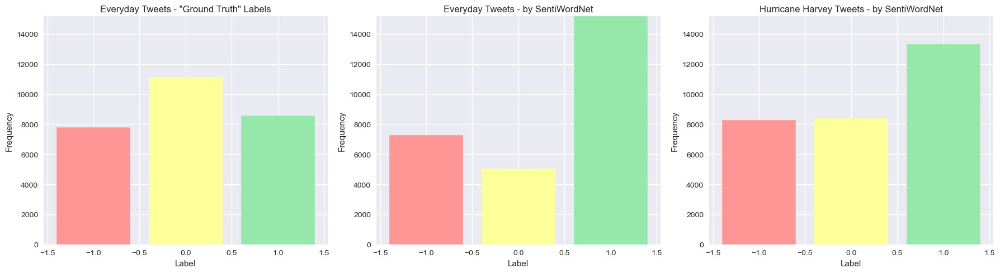

In [129]:
plotting('nltk_sentiwordnet', 'SentiWordNet')

<hr>

##### Lexicon: VADER (Valence Aware Dictionary and sEntiment Reasoner)

VADER is specifically attuned to sentiments expressed in social media. It uses a combination of sentiment-related words and emojis, along with some simple heuristics (punctuation, capitalisation, degree modifiers, conjuctions), to assign a sentiment score (positive, negative, or neutral) to a given piece of text. It's output sentiment score is a numeric score between -1 and +1. The word sentiment scores range from -4 to 4 (neg to pos). <br> <br>

> by Hutto & Gilbert [see model info](https://github.com/cjhutto/vaderSentiment)

In [124]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer    # VADER
sa = SentimentIntensityAnalyzer()  

scores = {}
listscores = []

for tweet in normal_tweets['text']:
    scores[sa.polarity_scores(tweet)['compound'] ] = str(tweet)
    listscores.append(sa.polarity_scores(tweet)['compound'])

normal_tweets['vader'] = listscores

scores1 = {}
listscores1 = []

for tweet in harvey_data['text']:
    scores1[sa.polarity_scores(tweet)['compound'] ] = str(tweet)
    listscores1.append(sa.polarity_scores(tweet)['compound'])

harvey_data['vader'] = listscores1

normal_tweets['vader'] = [1 if value >= 0.3 else -1 if value <= -0.3 else 0 for value in normal_tweets['vader']]
harvey_data['vader'] = [1 if value >= 0.3 else -1 if value <= -0.3 else 0 for value in harvey_data['vader']]


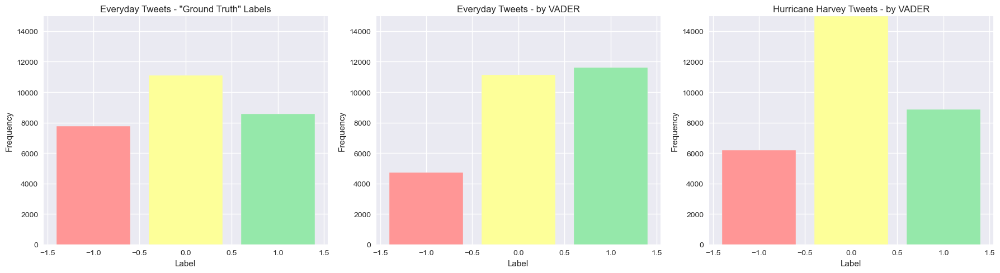

In [130]:
plotting('vader', 'VADER')

In [126]:
performance = calc_error_matrices(normal_tweets, 'VADER', 'label', 'vader')
performance

,Precision,Recall,Accuracy,F1
SentiWordNet,0.50,0.50,0.48,0.46
VADER,0.67,0.64,0.64,0.64


<hr>

##### Machine Learning Method: Naive Bayes

<img src="https://miro.medium.com/max/600/1*aFhOj7TdBIZir4keHMgHOw.png" width="40%" align="right">

Naive Bayes is a probabilistic algorithm (based on Bayes' theorem). It uses the probability of words or terms appearing in documents of different categories to determine the likelihood that a new document belongs to each category. It involves two basic steps: 
>
>**Training**: The algorithm learns the probability of words or terms appearing in each category. This is simply done by counting the number of occurrences of each word or term in the training corpus for each category and then computing the probability of each word or term given the category. This results in a set of word probabilities for each category.
>
>**Classification**: The algorithm uses the probabilities learned in the training step to classify new documents. For a new document, the algorithm calculates the likelihood of the document being in each category based on the probabilities of its words or terms. The category with the highest likelihood is chosen as the classification for the document.
>

The "naive" aspect of Naive Bayes comes from the assumption that the occurrences of words or terms in a document are independent of one another, which is not always true(!).

> by nltk [see model info](https://scikit-learn.org/stable/modules/naive_bayes.html)

In [135]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score

# split the data into training and testing sets
train_text, test_text, train_labels, test_labels = train_test_split(normal_tweets['text'], normal_tweets['label'], random_state=42)

# create a bag of words representation of the text data
vectorizer = CountVectorizer()
train_text_vectors = vectorizer.fit_transform(train_text)
test_text_vectors = vectorizer.transform(test_text)

# fit a Naive Bayes classifier on the training data
clf = MultinomialNB()
clf.fit(train_text_vectors, train_labels)

text_vectors = vectorizer.transform(normal_tweets['text'])

# make predictions on the text data using the trained classifier
predictions = clf.predict(text_vectors)

# add the predictions as a new column in the dataframe
normal_tweets['naive_bayes'] = predictions

# same for disaster data
text_vectors1 = vectorizer.transform(harvey_data['text'])
predictions1 = clf.predict(text_vectors1)

# add the predictions as a new column in the dataframe
harvey_data['naive_bayes'] = predictions1

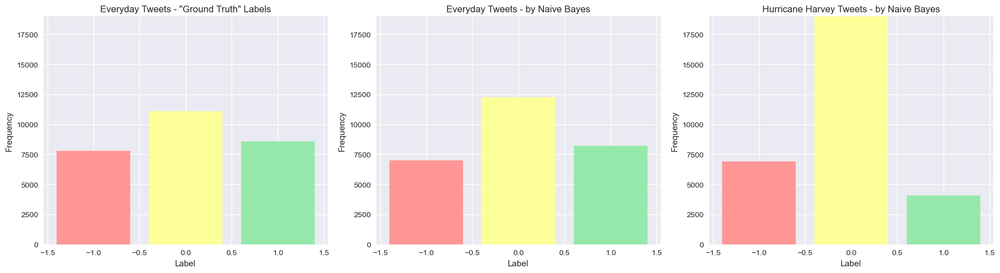

In [136]:
plotting('naive_bayes', 'Naive Bayes')

In [137]:
performance = calc_error_matrices(normal_tweets, 'Naive Bayes', 'label', 'naive_bayes')


In [138]:
performance

,Precision,Recall,Accuracy,F1
SentiWordNet,0.50,0.50,0.48,0.46
VADER,0.67,0.64,0.64,0.64
Naive Bayes,0.80,0.79,0.79,0.79


<hr>

##### Machine Learning Method: Support Vector Machine 

<img src="https://scikit-learn.org/stable/_images/sphx_glr_plot_svm_margin_thumb.png" align="right"> 

Using readily available libraries like sklearn, an SVM classifier (in this case SVC (Support Vector Classification)) can be trained for binary classification problems like pos-neg sentiment classification. The SVC classifier predicts the class label of a given sample based on the feature set. It solves the optimization problem to find a hyperplane that maximally separates the positive and negative class samples in the feature space. The optimization problem is solved using the maximum margin principle, where the margin is the distance between the hyperplane and the closest samples from each class, called support vectors. The SVC classifier is a useful tool for performing binary classification problems, particularly when the number of features is high, and the data is not linearly separable.

> by sklearn [see model info](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html)

In [139]:
# Import libraries
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn import svm

# split the data into training and testing sets
train_text, test_text, train_labels, test_labels = train_test_split(normal_tweets['text'], normal_tweets['label'], random_state=42)

# create a bag of words representation of the text data
vectorizer = CountVectorizer()
train_text_vectors = vectorizer.fit_transform(train_text)
test_text_vectors = vectorizer.transform(test_text)

# fit an SVM classifier on the training data
clf = SVC(kernel='linear')
clf.fit(train_text_vectors, train_labels)

# Test the classifier
X_new = vectorizer.transform(normal_tweets["text"])
y_pred = clf.predict(X_new)
normal_tweets['svm'] = y_pred

X_new1 = vectorizer.transform(harvey_data["text"])
y_pred1 = clf.predict(X_new1)
harvey_data['svm'] = y_pred1

Accuracy: 0.6958230243050502


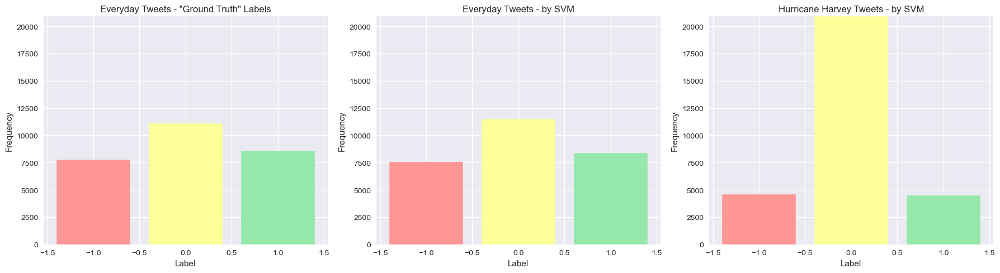

In [142]:
plotting('svm', 'SVM')

In [143]:
performance = calc_error_matrices(normal_tweets, 'SVM', 'label', 'svm')
performance

,Precision,Recall,Accuracy,F1
SentiWordNet,0.50,0.50,0.48,0.46
VADER,0.67,0.64,0.64,0.64
Naive Bayes,0.80,0.79,0.79,0.79
SVM,0.88,0.88,0.88,0.88


<hr>

##### Deep Learning Models

In recent years, the use of lexicon-based methods and traditional machine learning models for sentiment analysis has **decreased in popularity**. This shift has been largely driven by the **emergence of deep learning models**, which have shown impressive results on NLP tasks such as sentiment classification. With the availability of vast amounts of text data, deep learning models such as transformers have been able to capture more complex patterns and relationships within the data, leading to improved performance compared to lexicon-based and machine learning models. As a result, deep learning methods are now seen as the state-of-the-art approach for sentiment analysis and other NLP tasks.


<hr>

##### Recurrent Neural Network

<img src="https://miro.medium.com/max/627/1*go8PHsPNbbV6qRiwpUQ5BQ.png" width="40%" align="right">

A Recurrent Neural Network is a generalization of feedforward neural network that has an "internal memory". An RNN is recurrent in nature as it performs the same function for every input of data while the output of the current input depends on the past one computation. After producing the output, it is copied and sent back into the recurrent network. For making a decision, it considers the current input and the output that it has learned from the previous input.

> [see model info](https://aditi-mittal.medium.com/understanding-rnn-and-lstm-f7cdf6dfc14e)



In [234]:
import numpy as np
import pandas as pd
import re
#from sentiment_utils import *
from keras.models import Model
from keras.layers import Dense, Input, Dropout, LSTM, Activation
from keras.layers import Embedding
from keras.preprocessing import sequence
from keras.initializers import glorot_uniform
from keras.utils import np_utils
from keras.callbacks import EarlyStopping
from nltk.corpus import stopwords
np.random.seed(1)
from sklearn.model_selection import train_test_split

#from emo_utils import *
import matplotlib.pyplot as plt

%matplotlib inline

In [235]:
def remove_stopwords(input_text):
    '''
    Function to remove English stopwords from a Pandas Series.
    
    Parameters:
        input_text : text to clean
    Output:
        cleaned Pandas Series 
    '''
    stopwords_list = stopwords.words('english')
    # Some words which might indicate a certain sentiment are kept via a whitelist
    whitelist = ["n't", "not", "no"]
    words = input_text.split() 
    clean_words = [word for word in words if (word not in stopwords_list or word in whitelist) and len(word) > 1] 
    return " ".join(clean_words)

def remove_mentions(input_text):
    '''
    Function to remove mentions, preceded by @, in a Pandas Series
    
    Parameters:
        input_text : text to clean
    Output:
        cleaned Pandas Series 
    '''
    return re.sub(r'@\w+', '', input_text)

In [245]:
#cleaning Data
train_df = normal_tweets.copy()
train_df = train_df[['text', 'label']]
train_df.text = train_df.text.apply(remove_mentions)
train_df['sentiment'] = train_df['label']
train_df = train_df.drop(['label'], axis=1)
train_df.head()

,text,sentiment
0,"I`d have responded, if I were going",0
1,Sooo SAD I will miss you here in San Diego!!!,-1
2,my boss is bullying me...,-1
3,what interview! leave me alone,-1
4,"Sons of ****, why couldn`t they put them on t...",-1


In [246]:
#This step is to find the maximun length of the input string so as to fed the neural net with same length
raw_docs_train = train_df["text"].values
sentiment_train = train_df['sentiment'].values

maxLen = len(max(raw_docs_train, key=len).split())

In [247]:
#For our model we need to split our training dataset into test dataset. This is actually dev set for getting the loss
X_train, X_test, Y_train, Y_test = train_test_split(raw_docs_train, sentiment_train, 
                                                  stratify=sentiment_train, 
                                                  random_state=42, 
                                                  test_size=0.1, shuffle=True)
print('# Train data samples:', X_train.shape)
print('# Test data samples:', X_test.shape)
assert X_train.shape[0] == Y_train.shape[0]
assert X_test.shape[0] == Y_test.shape[0]

# Train data samples: (24732,)
# Test data samples: (2749,)


In [248]:
#Convert the labels to One hot encoding vector for softmax for neural network

#Y_oh_train = convert_to_one_hot(Y_train, C = num_labels)
num_labels = len(np.unique(sentiment_train))
Y_oh_train = np_utils.to_categorical(Y_train, num_labels)
Y_oh_test = np_utils.to_categorical(Y_test, num_labels)
print(Y_oh_train.shape)

(24732, 3)


In [251]:
#Now we need Glove Vectors for Word which is available online 
# word_to_index, index_to_word, word_to_vec_map = read_glove_vecs('../Data/glove.6B.50d.txt')

# load the GloVe vectors in a dictionary:

def read_glove_vecs(glove_file):
    with open(glove_file, encoding="utf8") as f:
        words = set()
        word_to_vec_map = {}
        for line in f:
            line = line.strip().split()
            curr_word = line[0]
            words.add(curr_word)
            word_to_vec_map[curr_word] = np.array(line[1:], dtype=np.float64)
        
        i = 1
        words_to_index = {}
        index_to_words = {}
        for w in sorted(words):
            words_to_index[w] = i
            index_to_words[i] = w
            i = i + 1
    return words_to_index, index_to_words, word_to_vec_map


word_to_index, index_to_word, word_to_vec_map = read_glove_vecs('../Data/Disaster_responses/glove.6B.50d.txt')

In [259]:
# This function convert array of strings into array of Indices of word in the voacab.

def sentences_to_indices(X, word_to_index, max_len):
    """
    Converts an array of sentences (strings) into an array of indices corresponding to words in the sentences.
    The output shape should be such that it can be given to `Embedding()` (described in Figure 4). 
    
    Arguments:
    X -- array of sentences (strings), of shape (m, 1)
    word_to_index -- a dictionary containing the each word mapped to its index
    max_len -- maximum number of words in a sentence. You can assume every sentence in X is no longer than this. 
    
    Returns:
    X_indices -- array of indices corresponding to words in the sentences from X, of shape (m, max_len)
    """
    
    m = X.shape[0]                                   # number of training examples
    
    # Initialize X_indices as a numpy matrix of zeros and the correct shape (≈ 1 line)
    X_indices = np.zeros((m,max_len))
    
    for i in range(m):                               # loop over training examples
        
        # Convert the ith training sentence in lower case and split is into words. You should get a list of words.
        sentence_words =[word.lower().replace('\t', '') for word in X[i].split(' ') if word.replace('\t', '') != '']
        
        # Initialize j to 0
        j = 0
        
        # Loop over the words of sentence_words
        for w in sentence_words:
            # Set the (i,j)th entry of X_indices to the index of the correct word.
            try:
                X_indices[i, j] = word_to_index[w]
            except: 0
            # Increment j to j + 1
            j = j+1
    
    return X_indices

In [260]:
# Create Keras Embedding layer
def pretrained_embedding_layer(word_to_vec_map, word_to_index):
    """
    Creates a Keras Embedding() layer and loads in pre-trained GloVe 50-dimensional vectors.
    
    Arguments:
    word_to_vec_map -- dictionary mapping words to their GloVe vector representation.
    word_to_index -- dictionary mapping from words to their indices in the vocabulary (400,001 words)

    Returns:
    embedding_layer -- pretrained layer Keras instance
    """
    
    vocab_len = len(word_to_index) + 1                  # adding 1 to fit Keras embedding (requirement)
    emb_dim = word_to_vec_map["cucumber"].shape[0]      # define dimensionality of your GloVe word vectors (= 50)
    
    # Initialize the embedding matrix as a numpy array of zeros of shape (vocab_len, dimensions of word vectors = emb_dim)
    emb_matrix = np.zeros((vocab_len,emb_dim))
    
    # Set each row "index" of the embedding matrix to be the word vector representation of the "index"th word of the vocabulary
    for word, index in word_to_index.items():
        emb_matrix[index, :] = word_to_vec_map[word]

    # Define Keras embedding layer with the correct output/input sizes, make it trainable. Use Embedding(...). Make sure to set trainable=False. 
    embedding_layer = Embedding(vocab_len, emb_dim, trainable = False)

    # Build the embedding layer, it is required before setting the weights of the embedding layer. Do not modify the "None".
    embedding_layer.build((None,))
    
    # Set the weights of the embedding layer to the embedding matrix. Your layer is now pretrained.
    embedding_layer.set_weights([emb_matrix])
    
    return embedding_layer

In [261]:
def ltsm_model(input_shape, word_to_vec_map, word_to_index):
    """
    Function creating the ltsm_model model's graph.
    
    Arguments:
    input_shape -- shape of the input, usually (max_len,)
    word_to_vec_map -- dictionary mapping every word in a vocabulary into its 50-dimensional vector representation
    word_to_index -- dictionary mapping from words to their indices in the vocabulary (400,001 words)

    Returns:
    model -- a model instance in Keras
    """
    
    ### START CODE HERE ###
    # Define sentence_indices as the input of the graph, it should be of shape input_shape and dtype 'int32' (as it contains indices).
    sentence_indices =  Input(shape=input_shape, dtype='int32')
    
    # Create the embedding layer pretrained with GloVe Vectors (≈1 line)
    embedding_layer = pretrained_embedding_layer(word_to_vec_map, word_to_index)
    
    # Propagate sentence_indices through your embedding layer, you get back the embeddings
    embeddings = embedding_layer(sentence_indices)   
    
    # Propagate the embeddings through an LSTM layer with 128-dimensional hidden state
    # Be careful, the returned output should be a batch of sequences.
    X = LSTM(128, return_sequences=True)(embeddings)
    # Add dropout with a probability of 0.5
    X = Dropout(0.5)(X)
    # Propagate X trough another LSTM layer with 128-dimensional hidden state
    # Be careful, the returned output should be a single hidden state, not a batch of sequences.
    X = LSTM(128, return_sequences=False)(X)
    # Add dropout with a probability of 0.5
    X = Dropout(0.5)(X)
    # Propagate X through a Dense layer with softmax activation to get back a batch of 5-dimensional vectors.
    X = Dense(3, activation=None)(X)
    # Add a softmax activation
    X = Activation('softmax')(X)
    
    # Create Model instance which converts sentence_indices into X.
    model = Model(inputs=[sentence_indices], outputs=X)
    
    ### END CODE HERE ###
    
    return model

In [262]:
model = ltsm_model((maxLen,), word_to_vec_map, word_to_index)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 29)]              0         
                                                                 
 embedding_1 (Embedding)     (None, 29, 50)            20000050  
                                                                 
 lstm (LSTM)                 (None, 29, 128)           91648     
                                                                 
 dropout (Dropout)           (None, 29, 128)           0         
                                                                 
 lstm_1 (LSTM)               (None, 128)               131584    
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 3)                 387   

In [263]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [264]:
X_train_indices = sentences_to_indices(X_train, word_to_index, maxLen)
X_test_indices = sentences_to_indices(X_test, word_to_index, maxLen)
print(X_train_indices.shape)

(24732, 29)


In [265]:
earlystop = EarlyStopping(monitor='val_loss', min_delta=0, patience=3, verbose=0, mode='auto')

model.fit(X_train_indices, y=Y_oh_train, batch_size=512, epochs=20, 
          verbose=1, validation_data=(X_test_indices, Y_oh_test), callbacks=[earlystop])

Epoch 1/20
49/49 [==============================] - 41s 755ms/step - loss: 1.0103 - accuracy: 0.4885 - val_loss: 0.9641 - val_accuracy: 0.5522
Epoch 2/20
49/49 [==============================] - 36s 735ms/step - loss: 0.9149 - accuracy: 0.5708 - val_loss: 0.8969 - val_accuracy: 0.5853
Epoch 3/20
49/49 [==============================] - 37s 747ms/step - loss: 0.8906 - accuracy: 0.5885 - val_loss: 0.8842 - val_accuracy: 0.5919
Epoch 4/20
49/49 [==============================] - 37s 749ms/step - loss: 0.8614 - accuracy: 0.6095 - val_loss: 0.8770 - val_accuracy: 0.6130
Epoch 5/20
49/49 [==============================] - 37s 751ms/step - loss: 0.8407 - accuracy: 0.6213 - val_loss: 0.8407 - val_accuracy: 0.6297
Epoch 6/20
49/49 [==============================] - 37s 757ms/step - loss: 0.8210 - accuracy: 0.6338 - val_loss: 0.8269 - val_accuracy: 0.6246
Epoch 7/20
49/49 [==============================] - 37s 760ms/step - loss: 0.8139 - accuracy: 0.6410 - val_loss: 0.8275 - val_accuracy: 0.6279

In [271]:
#Check Prediction for a particular example
# Change the sentence below to see your prediction. Make sure all the words are in the Glove embeddings.  
# x_test = np.array(['Good Airlines'])

x_test = np.array(['how randowm day'])
X_test_indices = sentences_to_indices(x_test, word_to_index, maxLen)
print(x_test[0] +' '+  str(np.argmax(model.predict(X_test_indices))))



1/1 [==============================] - 0s 19ms/step
how randowm day 0


In [200]:
import tensorflow
from sklearn.feature_extraction.text import CountVectorizer

normal_tweets_copy = normal_tweets.copy()

# Form vocab dictionary
vectorizer = CountVectorizer()
vectorizer.fit_transform(normal_tweets_copy['text'].tolist())
vocab_text = vectorizer.vocabulary_

# Convert text
def convert_text(text):
    text_list = text.split(' ')
    return [vocab_text.get(t, 0)+1 for t in text_list]

normal_tweets_copy['text'] = normal_tweets_copy['text'].apply(convert_text)

# Get X and y matrices
y = np.array(normal_tweets_copy['label'])
X = np.array(normal_tweets_copy['text'])



In [202]:
print(len(y))
print(len(X))

print(len(X) * 0.25)
split = 6870

x_train = X[:split]
x_test = X[split:]
y_train = y[:split]
y_test = y[split:]

27481
27481
6870.25


In [203]:
from tensorflow.keras.layers import SimpleRNN, LSTM, GRU, Bidirectional, Dense, Embedding
# from tensorflow.keras.datasets import imdb
from tensorflow.keras.models import Sequential
import numpy as np

vocab_size = 5000

print(x_train[0])

[1, 1, 11516, 1, 12349, 1, 25305, 10795]


In [204]:
from tensorflow.keras.preprocessing import sequence
 
# Keeping a fixed length of all reviews to max 400 words
max_words = 400
 
x_train = sequence.pad_sequences(x_train, maxlen=max_words)
x_test = sequence.pad_sequences(x_test, maxlen=max_words)
 
x_valid, y_valid = x_train[:64], y_train[:64]
x_train_, y_train_ = x_train[64:], y_train[64:]

In [209]:
# fixing every word's embedding size to be 32
embd_len = 32
vocab_size=28000

# Creating a RNN model
RNN_model = Sequential(name="Simple_RNN")
RNN_model.add(Embedding(vocab_size,
                        embd_len,
                        input_length=max_words))
 
# In case of a stacked(more than one layer of RNN)
# use return_sequences=True
RNN_model.add(SimpleRNN(128,
                        activation='tanh',
                        return_sequences=False))
RNN_model.add(Dense(1, activation='sigmoid'))
 
# printing model summary
print(RNN_model.summary())
 
# Compiling model
RNN_model.compile(
    loss="binary_crossentropy",
    optimizer='adam',
    metrics=['accuracy']
)
 
# Training the model
history = RNN_model.fit(x_train_, y_train_,
                        batch_size=64,
                        epochs=5,
                        verbose=1,
                        validation_data=(x_valid, y_valid))
 
# Printing model score on test data
print()
print("Simple_RNN Score---> ", RNN_model.evaluate(x_test, y_test, verbose=0))

Model: "Simple_RNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 400, 32)           896000    
                                                                 
 simple_rnn (SimpleRNN)      (None, 128)               20608     
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 916,737
Trainable params: 916,737
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/5
107/107 [==============================] - 11s 95ms/step - loss: 0.2517 - accuracy: 0.4017 - val_loss: -0.4331 - val_accuracy: 0.4062
Epoch 2/5
107/107 [==============================] - 10s 93ms/step - loss: 0.1607 - accuracy: 0.4048 - val_loss: -0.4198 - val_accuracy: 0.4062
Epoch 3/5
107/107 [==

In [210]:
def predict_class(text, model, max_words, vocab_text):
    text_list = text.split(' ')
    converted_text = [vocab_text.get(t, 0)+1 for t in text_list]
    padded_text = sequence.pad_sequences([converted_text], maxlen=max_words)
    prediction = model.predict(padded_text)
    return prediction[0][0]

test_copy = normal_tweets.copy()

test_copy['rnn'] = test_copy['text'].apply(lambda x: predict_class(x, RNN_model, max_words, vocab_text))

1/1 [==============================] - 0s 24ms/step


In [211]:
test_copy.head()

,textID,text,selected_text,sentiment,label,nltk_sentiwordnet,vader,naive_bayes,svm,cardiffroberta,bertweet,finetunedBERT,rnn
0,cb774db0d1,"I`d have responded, if I were going","I`d have responded, if I were going",neutral,0,0,0,0,0,0,0,0,6.511221e-16
1,549e992a42,Sooo SAD I will miss you here in San Diego!!!,Sooo SAD,negative,-1,-1,-1,-1,-1,-1,-1,-1,5.692983e-16
2,088c60f138,my boss is bullying me...,bullying me,negative,-1,1,-1,-1,-1,-1,-1,-1,4.788270e-16
3,9642c003ef,what interview! leave me alone,leave me alone,negative,-1,0,-1,-1,0,-1,-1,0,1.192827e-16
4,358bd9e861,"Sons of ****, why couldn`t they put them on t...","Sons of ****,",negative,-1,1,0,0,-1,-1,-1,-1,3.372712e-15


In [208]:
from keras import backend as K
K.clear_session()

In [232]:
# I'm importing everything up here to improve readability later on,
# but it's also common to just:
#     import tensorflow as tf
# and then access whatever you need directly from tf.
from tensorflow.keras.preprocessing import text_dataset_from_directory
from tensorflow.strings import regex_replace
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization
from tensorflow.keras.models import Sequential
from tensorflow.keras import Input
from tensorflow.keras.layers import Dense, LSTM, Embedding, Dropout

def prepareData(dir):
  data = text_dataset_from_directory(dir)
  return data.map(
    lambda text, label: (regex_replace(text, '<br />', ' '), label),
  )

# Assumes you're in the root level of the dataset directory.
# If you aren't, you'll need to change the relative paths here.
train_data = normal_tweets[6870:]
test_data = normal_tweets[:6870]

for text_batch, label_batch in train_data.take(1):
  print(text_batch.numpy()[0])
  print(label_batch.numpy()[0]) # 0 = negative, 1 = positive


model = Sequential()

# ----- 1. INPUT
# We need this to use the TextVectorization layer next.
model.add(Input(shape=(1,), dtype="string"))

# ----- 2. TEXT VECTORIZATION
# This layer processes the input string and turns it into a sequence of
# max_len integers, each of which maps to a certain token.
max_tokens = 1000
max_len = 100
vectorize_layer = TextVectorization(
  # Max vocab size. Any words outside of the max_tokens most common ones
  # will be treated the same way: as "out of vocabulary" (OOV) tokens.
  max_tokens=max_tokens,
  # Output integer indices, one per string token
  output_mode="int",
  # Always pad or truncate to exactly this many tokens
  output_sequence_length=max_len,
)

# Call adapt(), which fits the TextVectorization layer to our text dataset.
# This is when the max_tokens most common words (i.e. the vocabulary) are selected.
train_texts = train_data.map(lambda text, label: text)
vectorize_layer.adapt(train_texts)

model.add(vectorize_layer)

# ----- 3. EMBEDDING
# This layer turns each integer (representing a token) from the previous layer
# an embedding. Note that we're using max_tokens + 1 here, since there's an
# out-of-vocabulary (OOV) token that gets added to the vocab.
model.add(Embedding(max_tokens + 1, 128))

# ----- 4. RECURRENT LAYER
model.add(LSTM(64))

# ----- 5. DENSE HIDDEN LAYER
model.add(Dense(64, activation="relu"))

# ----- 6. OUTPUT
model.add(Dense(1, activation="sigmoid"))


# Compile and train the model.
model.compile(loss="binary_crossentropy", optimizer="adam", metrics=["accuracy"])
model.fit(train_data, epochs=10)

model.save_weights('rnn')

model.load_weights('rnn')

# Try the model on our test dataset.
model.evaluate(test_data)

# Should print a very high score like 0.98.
print(model.predict([
  "i loved it! highly recommend it to anyone and everyone looking for a great movie to watch.",
]))

# Should print a very low score like 0.01.
print(model.predict([
  "this was awful! i hated it so much, nobody should watch this. the acting was terrible, the music was terrible, overall it was just bad.",
]))

AssertionError: <class 'numpy.int64'>

<hr>

##### Gated Recurrent Units

<img src="https://liyanxu.blog/wp-content/uploads/2019/01/Screen-Shot-2019-01-24-at-20.13.36-300x208.png" width="30%" align="right">

A Gated Recurrent Unit (GRU) is a type of Recurrent Neural Network (RNN) that is used to process sequential data. It is designed to handle the vanishing gradient problem that can occur when training traditional RNNs by incorporating gating mechanisms. 

> [see model info](https://www.geeksforgeeks.org/gated-recurrent-unit-networks/)

In [ ]:
# Defining GRU model
gru_model = Sequential(name="GRU_Model")
gru_model.add(Embedding(vocab_size,
                        embd_len,
                        input_length=max_words))
gru_model.add(GRU(128,
                  activation='tanh',
                  return_sequences=False))
gru_model.add(Dense(1, activation='sigmoid'))
 
# Printing the Summary
print(gru_model.summary())
 
# Compiling the model
gru_model.compile(
    loss="binary_crossentropy",
    optimizer='adam',
    metrics=['accuracy']
)
 
# Training the GRU model
history2 = gru_model.fit(x_train_, y_train_,
                         batch_size=64,
                         epochs=5,
                         verbose=1,
                         validation_data=(x_valid, y_valid))
 
# Printing model score on test data
print()
print("GRU model Score---> ", gru_model.evaluate(x_test, y_test, verbose=0))

<hr>

##### Long Short Term Memory Network

<img src="https://www.iarai.ac.at/wp-content/uploads/2021/02/MC-LSTM.jpg" align="right" width="30%">

LSTM (Long Short-Term Memory) is a type of Recurrent Neural Network (RNN) that is designed to overcome the problem of vanishing gradients in traditional RNNs by introducing a gating mechanism that controls the flow of information within the network. An LSTM network contains a series of memory cells that are responsible for remembering the information from earlier time steps. There are three gates in an LSTM cell that control the flow of information: the input gate, the forget gate, and the output gate. These gates allow the LSTM to selectively decide which information to forget and which information to pass to the output.

> [see model info](https://colah.github.io/posts/2015-08-Understanding-LSTMs/index.html)


In [ ]:
# Defining LSTM model
lstm_model = Sequential(name="LSTM_Model")
lstm_model.add(Embedding(vocab_size,
                         embd_len,
                         input_length=max_words))
lstm_model.add(LSTM(128,
                    activation='relu',
                    return_sequences=False))
lstm_model.add(Dense(1, activation='sigmoid'))
 
# Printing Model Summary
print(lstm_model.summary())
 
# Compiling the model
lstm_model.compile(
    loss="binary_crossentropy",
    optimizer='adam',
    metrics=['accuracy']
)
 
# Training the model
history3 = lstm_model.fit(x_train_, y_train_,
                          batch_size=64,
                          epochs=5,
                          verbose=2,
                          validation_data=(x_valid, y_valid))
 
# Displaying the model accuracy on test data
print()
print("LSTM model Score---> ", lstm_model.evaluate(x_test, y_test, verbose=0))

<hr>

##### Transformer-Based Models

In recent years, the transformer model has revolutionized the field of NLP. This 'new' deep learning approach has been highly successful in a variety NLP tasks, including sentiment analysis. The transformer model offers several advantages over traditional machine learning and even other deep learning approaches and have been shown to outperform traditional machine learning and other deep learning methods on NLP tasks, particularly sentiment analysis. Some of the key advantages it has are:

- The **encoder-decoder framework**: Encoder generates a representation of the input (semantic, context, positional) and the decoder generates output. Common use case: sequence to sequence translation tasks.

- **Attention mechanisms**: Deals with the information bottleneck of the traditional encoder-decoder architecture (where one final encoder hidden state is passed to decoder) by allowing the decoder to access the hidden states at each step and being able to prioritise which state is most relevant. 

- **Transfer learning** (i.e. fine-tuning a pre-trained language model)

<br>
<br>

<img src="https://www.oreilly.com/api/v2/epubs/9781098136789/files/assets/nlpt_0101.png" align="center">


<hr>

##### Transformer-Based Model: RoBERTa

RoBERTA (Robustly Optimized BERT Pretraining Approach) has the same architecture as BERT but marks an improved version of BERT for several reasons: 

- RoBERTa was trained on **10x as much data** as was used for BERT training (160GB, compared to 16GB for BERT)
- **Dynamic masking** was used during training, rather than fixed masking in BERT
- the **next sentence prediction was left out** during training, which is arguably not essential especially when considering tweets. 

> by cardiffnlp [see model info](https://huggingface.co/cardiffnlp/twitter-roberta-base-sentiment-latest?text=Covid+cases+are+increasing+fast%21)

In [161]:
# Preprocess text (username and link placeholders)
def preprocess(text):
    new_text = []
 
    for t in text.split(" "):
        t = '@user' if t.startswith('@') and len(t) > 1 else t
        t = 'http' if t.startswith('http') else t
        new_text.append(t)
    return " ".join(new_text)

In [162]:
tw_rob_base_sent_lat = "cardiffnlp/twitter-roberta-base-sentiment-latest"
tokenizer_tw_rob_base_sent_lat = AutoTokenizer.from_pretrained(tw_rob_base_sent_lat)
config_tw_rob_base_sent_lat = AutoConfig.from_pretrained(tw_rob_base_sent_lat)
# PT
model_tw_rob_base_sent_lat = AutoModelForSequenceClassification.from_pretrained(tw_rob_base_sent_lat)
#model.save_pretrained(tw_rob_base_sent_lat)

Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.weight', 'roberta.pooler.dense.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [166]:
# apply in the form of a function so it can be called for usecase later on
def robertabase_apply(dataset):
    
    # create variable for labels (good to bad)
    labels= ['positive', 'neutral', 'negative']
    
    # lists to be filled
    cardiffroberta_sentiment_prediction = []
    cardiffroberta_sentiment_prediction_softmax = []
    cardiffroberta_sentiment_prediction_num = []
    
    # iterate over dataset
    for index, row in dataset.iterrows():
        text = row['text']
        text = preprocess(text)
        encoded_input = tokenizer_tw_rob_base_sent_lat(text, truncation=True, max_length=500, return_tensors='pt')
        output = model_tw_rob_base_sent_lat(**encoded_input)
        score = np.round(softmax(output[0][0].detach().numpy()), 4)
        label = config_tw_rob_base_sent_lat.id2label[np.argsort(score)[::-1][0]]
        cardiffroberta_sentiment_prediction.append(label)
        cardiffroberta_sentiment_prediction_softmax.append(max(score))
        # positive label
        if label == labels[0]:
            cardiffroberta_sentiment_prediction_num.append(1)
        # negative label
        elif label == labels[2]:
            cardiffroberta_sentiment_prediction_num.append(-1)
        # neutral label
        else:
            cardiffroberta_sentiment_prediction_num.append(0)


    #dataset['cardiffroberta_sentiment_prediction'] = cardiffroberta_sentiment_prediction
    #dataset['cardiffroberta_sentiment_prediction_softmax'] = cardiffroberta_sentiment_prediction_softmax
    dataset['cardiffroberta'] = cardiffroberta_sentiment_prediction_num

    model_name = "cardiffroberta"
    
    # model name and labels will be needed later on as input variables for plotting and mapping
    print("Variables that will later be required for plotting and mapping:")
    return model_name, labels


In [ ]:
robertabase_apply(dataset=normal_tweets)

In [167]:
robertabase_apply(dataset=harvey_data)

Variables that will later be required for plotting and mapping:


('cardiffroberta', ['positive', 'neutral', 'negative'])

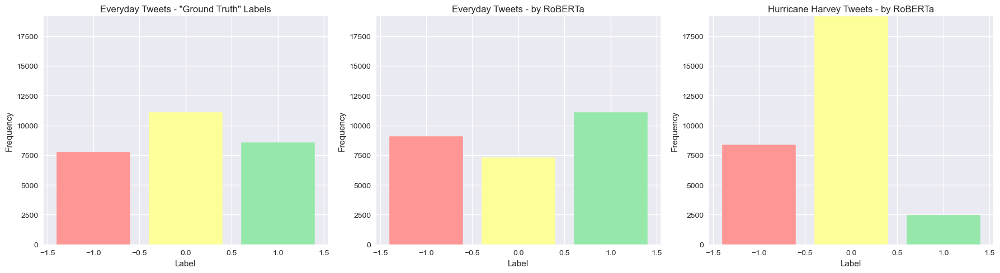

In [168]:
plotting('cardiffroberta', 'RoBERTa')

In [169]:
performance = calc_error_matrices(normal_tweets, 'RoBERTa', 'label', 'cardiffroberta')
performance

,Precision,Recall,Accuracy,F1
SentiWordNet,0.50,0.50,0.48,0.46
VADER,0.67,0.64,0.64,0.64
Naive Bayes,0.80,0.79,0.79,0.79
SVM,0.88,0.88,0.88,0.88
RoBERTa,0.71,0.73,0.71,0.71


<hr>

##### Transformer-based Model: BERTweet

<img align="right" src="https://miro.medium.com/max/740/1*G6PYuBxc7ryP4Pz7nrZJgQ@2x.png" width="40%">


This is a BERTweet-base RoBERTa model trained on SemEval 2017 (~40k Tweets). It uses POS, NEG, NEU labels and is suitable for English and Spanish languages. pysentimiento is an open-source library for non-commercial use and scientific research purposes only. Please be aware that models are trained with third-party datasets and are subject to their respective licenses.

> by finiteautomata [see model info](https://huggingface.co/finiteautomata/bertweet-base-sentiment-analysis?text=I+hate+this)

In [170]:
bertweetanalyzer = create_analyzer(task="sentiment", lang="en")

In [171]:
# apply in the form of a function so it can be called for usecase later on
def bertweet_apply(dataset):
    
    # create labels variable
    labels = ['POS', 'NEU', 'NEG']
    
    # lists to be filled
    bertweet_sentiment_prediction = []
    bertweet_sentiment_prediction_softmax = []
    bertweet_sentiment_prediction_num = []  
    
    # iterate over dataframe
    for index, row in dataset.iterrows():
        text = row['text']
        text = bertweetpreprocess(text)
        result = bertweetanalyzer.predict(text)
        label = result.output
        bertweet_sentiment_prediction.append(label)
        bertweet_sentiment_prediction_softmax.append(np.round(result.probas[label], 4))
        if label == labels[0]:
            bertweet_sentiment_prediction_num.append(1)
        elif label == labels[2]:
            bertweet_sentiment_prediction_num.append(-1)
        else:
            bertweet_sentiment_prediction_num.append(0)


    #dataset['bertweet_sentiment_prediction'] = bertweet_sentiment_prediction
    #dataset['bertweet_sentiment_prediction_softmax'] = bertweet_sentiment_prediction_softmax
    dataset['bertweet'] = bertweet_sentiment_prediction_num
    
    model_name = "bertweet"
    
    # model name and labels will be needed later on as input variables for plotting and mapping
    print("Variables that will later be required for plotting and mapping:")    
    return model_name, labels


In [172]:
# apply model to goldstandard
bertweet_apply(dataset=normal_tweets)
bertweet_apply(dataset=harvey_data)

Variables that will later be required for plotting and mapping:
Variables that will later be required for plotting and mapping:


('bertweet', ['POS', 'NEU', 'NEG'])

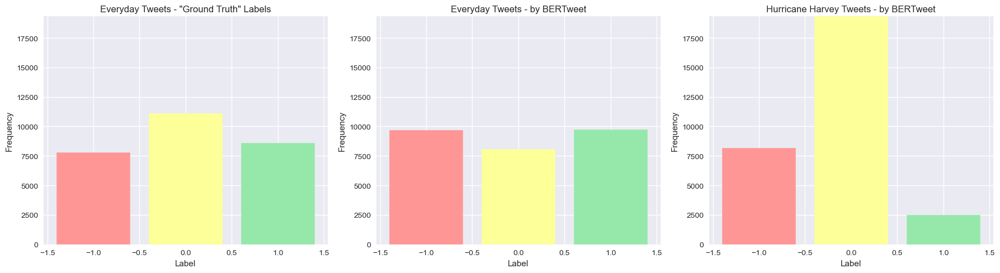

In [173]:
plotting('bertweet', 'BERTweet')

In [174]:
calc_error_matrices(normal_tweets, 'BERTweet', 'label', 'bertweet')

,Precision,Recall,Accuracy,F1
SentiWordNet,0.50,0.50,0.48,0.46
VADER,0.67,0.64,0.64,0.64
Naive Bayes,0.80,0.79,0.79,0.79
SVM,0.88,0.88,0.88,0.88
RoBERTa,0.71,0.73,0.71,0.71
BERTweet,0.71,0.72,0.70,0.71


<hr>

#### Fine-Tuned Downstream Sentiment Analysis

This is a BERT base model (uncased), pretrained on English language using a masked language modeling (MLM) objective. This model is uncased: it does not make a difference between english and English.

This is a fine-tuned downstream version of the bert-base-uncased model for sentiment analysis, this model is not intended for further downstream fine-tuning for any other tasks. This model is trained on a classified dataset for text classification.

> by seethal [see model info](https://huggingface.co/Seethal/sentiment_analysis_generic_dataset)

In [175]:
tokenizer_seethal_gen_data = AutoTokenizer.from_pretrained("Seethal/sentiment_analysis_generic_dataset")
model_seethal_gen_data = AutoModelForSequenceClassification.from_pretrained("Seethal/sentiment_analysis_generic_dataset")

loading file vocab.txt from cache at C:\Users\Christina/.cache\huggingface\hub\models--Seethal--sentiment_analysis_generic_dataset\snapshots\26edc13094473094204e42245018bee141699c8c\vocab.txt
loading file tokenizer.json from cache at C:\Users\Christina/.cache\huggingface\hub\models--Seethal--sentiment_analysis_generic_dataset\snapshots\26edc13094473094204e42245018bee141699c8c\tokenizer.json
loading file added_tokens.json from cache at None
loading file special_tokens_map.json from cache at C:\Users\Christina/.cache\huggingface\hub\models--Seethal--sentiment_analysis_generic_dataset\snapshots\26edc13094473094204e42245018bee141699c8c\special_tokens_map.json
loading file tokenizer_config.json from cache at C:\Users\Christina/.cache\huggingface\hub\models--Seethal--sentiment_analysis_generic_dataset\snapshots\26edc13094473094204e42245018bee141699c8c\tokenizer_config.json
loading configuration file config.json from cache at C:\Users\Christina/.cache\huggingface\hub\models--Seethal--sentimen

In [178]:
# apply in the form of a function so it can be called for usecase later on
def seethal_gen_data_apply(dataset):
    
    # create variable for labels (good to bad)
    labels= ['positive', 'neutral', 'negative']
    
    # lists to be filled
    seethal_gen_data_sentiment_prediction = []
    seethal_gen_data_sentiment_prediction_softmax = []
    seethal_gen_data_sentiment_prediction_num = []
    
    # iterate over dataset
    for index, row in dataset.iterrows():
        text = row['text']
        text = preprocess(text)
        encoded_input = tokenizer_seethal_gen_data(text, truncation=True, max_length=500, return_tensors='pt')
        output = model_seethal_gen_data(**encoded_input)
        score = np.round(softmax(output[0][0].detach().numpy()), 4)
        label = config_tw_rob_base_sent_lat.id2label[np.argsort(score)[::-1][0]]
        seethal_gen_data_sentiment_prediction.append(label)
        seethal_gen_data_sentiment_prediction_softmax.append(max(score))
        # positive label
        if label == labels[0]:
            seethal_gen_data_sentiment_prediction_num.append(1)
        # negative label
        elif label == labels[2]:
            seethal_gen_data_sentiment_prediction_num.append(-1)
        # neutral label
        else:
            seethal_gen_data_sentiment_prediction_num.append(0)


    #dataset['seethal_gen_data_sentiment_prediction'] = seethal_gen_data_sentiment_prediction
    #dataset['seethal_gen_data_sentiment_prediction_softmax'] = seethal_gen_data_sentiment_prediction_softmax
    dataset['finetunedBERT'] = seethal_gen_data_sentiment_prediction_num

    model_name = "seethal_gen_data"
    
    # model name and labels will be needed later on as input variables for plotting and mapping
    print("Variables that will later be required for plotting and mapping:")
    return model_name, labels


In [179]:
seethal_gen_data_apply(dataset=normal_tweets)
seethal_gen_data_apply(dataset=harvey_data)

Variables that will later be required for plotting and mapping:
Variables that will later be required for plotting and mapping:


('seethal_gen_data', ['positive', 'neutral', 'negative'])

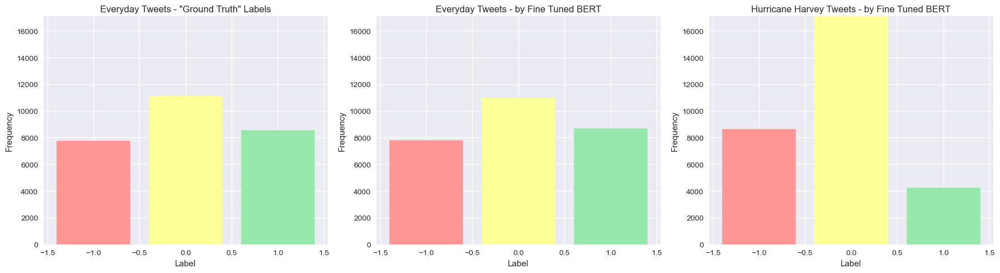

In [180]:
plotting('finetunedBERT', 'Fine Tuned BERT')

In [181]:
performance = calc_error_matrices(normal_tweets, 'Fine Tuned BERT', 'label', 'finetunedBERT')
performance

,Precision,Recall,Accuracy,F1
SentiWordNet,0.50,0.50,0.48,0.46
VADER,0.67,0.64,0.64,0.64
Naive Bayes,0.80,0.79,0.79,0.79
SVM,0.88,0.88,0.88,0.88
RoBERTa,0.71,0.73,0.71,0.71
BERTweet,0.71,0.72,0.70,0.71
Fine Tuned BERT,0.78,0.78,0.78,0.78


<hr>

##### Data Visualisations

In [273]:
import geopandas as gpd

# Read in the shapefile
gdf_harvey = gpd.read_file("../Data/Disaster_responses/tweets-hurricane-harvey/filtered_hurricane_harvey.shp")

# Check the type of the GeoDataFrame
# print(type(gdf_harvey))

In [336]:
gdf_harvey = gdf_harvey.rename(columns={'TEXT':'text', 'DATE': 'date'})
gdf_harvey.head()


,TWEET_ID,date,text,LAT,LONG,MATCHING_I,TOPIC_NUMB,PROBABILIT,WEIGHT,geometry,bertweet
0,9.058685e+17,2017-09-07 19:00:49,Two more days!!! https://t.co/vydsOgG5RY,30.223722,-97.744334,29,0,0.066667,1,POINT (620838.338 3344242.541),1
1,9.041387e+17,2017-09-03 00:27:26,Baton Rouge: 7:24pm: sunset,30.440000,-91.190000,212,0,0.666367,1,POINT (1251048.695 3393577.497),0
2,9.057606e+17,2017-09-07 11:52:06,Be Prepared! Stay Prepared! @ Fire Station 93 ...,29.590136,-95.180497,17,8,0.666367,1,POINT (870027.953 3279466.422),1
3,9.010665e+17,2017-08-25 12:59:26,"#hurricaneharvey @ Houston, Texas https://t.co...",29.762900,-95.383200,1972,1,0.999534,1,POINT (849776.868 3297998.151),0
4,9.058019e+17,2017-09-07 14:36:20,Just posted a photo @ Ruff Cuts &amp; PurrFect...,30.228525,-92.658851,20,1,0.999650,1,POINT (1110801.489 3361168.665),1


In [276]:
# apply to use case (trained for english tweets)
gdf_harvey['text'] = gdf_harvey['text'].astype(str)
name, labels = bertweet_apply(gdf_harvey)

Variables that will later be required for plotting and mapping:


In [282]:
gdf_harvey.head()

,TWEET_ID,DATE,text,LAT,LONG,MATCHING_I,TOPIC_NUMB,PROBABILIT,WEIGHT,geometry,bertweet
0,9.058685e+17,2017-09-07 19:00:49,Two more days!!! https://t.co/vydsOgG5RY,30.223722,-97.744334,29,0,0.066667,1,POINT (620838.338 3344242.541),1
1,9.041387e+17,2017-09-03 00:27:26,Baton Rouge: 7:24pm: sunset,30.440000,-91.190000,212,0,0.666367,1,POINT (1251048.695 3393577.497),0
2,9.057606e+17,2017-09-07 11:52:06,Be Prepared! Stay Prepared! @ Fire Station 93 ...,29.590136,-95.180497,17,8,0.666367,1,POINT (870027.953 3279466.422),1
3,9.010665e+17,2017-08-25 12:59:26,"#hurricaneharvey @ Houston, Texas https://t.co...",29.762900,-95.383200,1972,1,0.999534,1,POINT (849776.868 3297998.151),0
4,9.058019e+17,2017-09-07 14:36:20,Just posted a photo @ Ruff Cuts &amp; PurrFect...,30.228525,-92.658851,20,1,0.999650,1,POINT (1110801.489 3361168.665),1


Ratios between pos, neu, and neg sentiments: [4891, 21570, 2472]


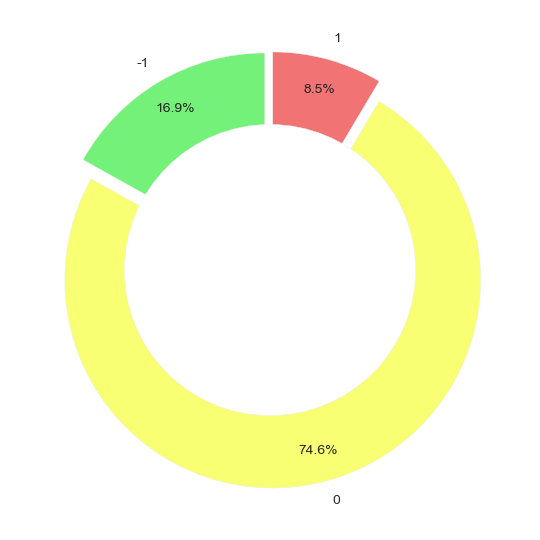

In [332]:
labels = [-1, 0, 1]
# count label frequencies and save in list
pos = list(gdf_harvey['bertweet']).count(labels[2])
neu = list(gdf_harvey['bertweet']).count(labels[1])
neg = list(gdf_harvey['bertweet']).count(labels[0])
ratios = [pos, neu, neg]
print(f"Ratios between pos, neu, and neg sentiments: {ratios}")

# create simple piechart to show ratios between the sentiment labels
create_piechart(ratios, labels=labels, title='Sentiments in harvey Tweets')

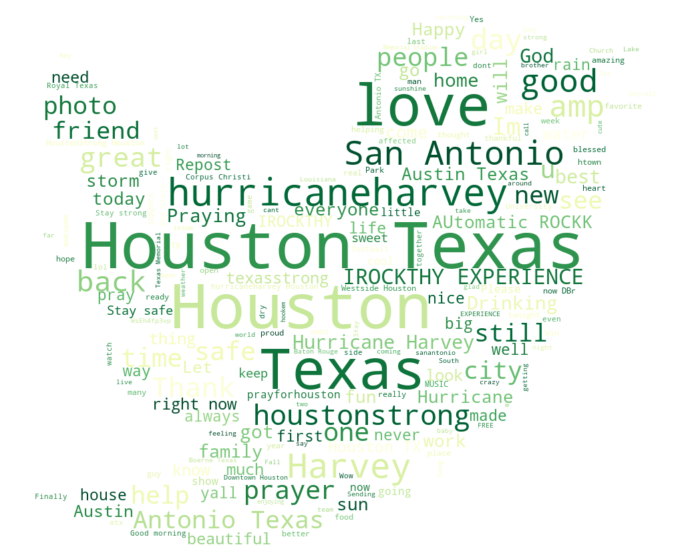

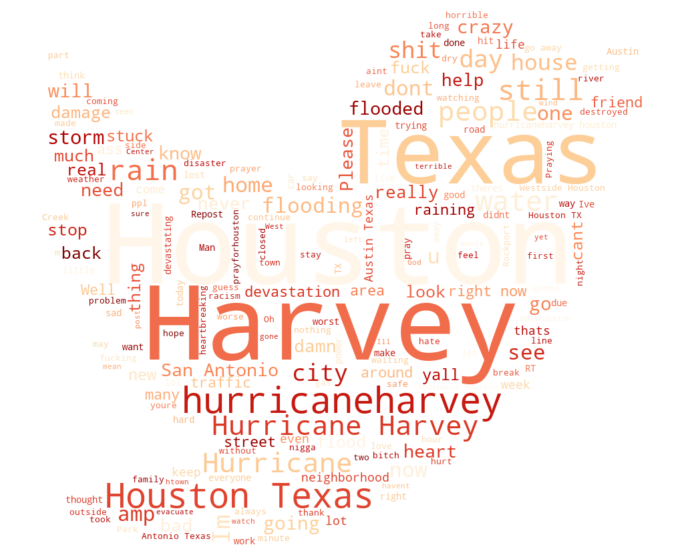

In [333]:
create_pos_neg_tweet_wordcloud(df=gdf_harvey, labels_col= 'bertweet', labels=labels)

In [295]:
# create an interactive folium map
# for map center USA is 'United States', UK is 'United Kingdom'
from folium.plugins import FloatImage
gdf_harvey_sample = gdf_harvey.sample(1000)
#frm = gpd.GeoDataFrame(polygondf, crs="EPSG:4326", geometry='geometry')
#frm.crs # epsg:3006
frm = gdf_harvey_sample.to_crs(epsg=4326) # now crs is updated

folium_map = create_folium_map(df = frm, 
                               map_center = 'USA', 
                               tiles = 'cartodbpositron', 
                               zoom_start = 5, 
                               n_labels = 3, 
                               text_col = 'text', 
                               #senti_label_col = 'bertweet', 
                               #senti_score_col = 'bertweet', 
                               senti_num_label_col = 'bertweet'
                              )

# display map
folium_map

Country USA was either not found or too many matches found in centroids dataframe. Defaulting to USA.



<img src="https://github.com/Christina1281995/demo-repo/blob/main/hotspots.PNG?raw=true">


In [334]:
time_interval = 'Day'

In [346]:
# create a timeline showing sentiment quantities over time
time_df, fig = create_df_for_time_chart_three_labels(df=gdf_harvey, time_interval=time_interval, labels_col='bertweet', labels=labels)
# fig.show()

In [347]:
fig.show()
fig.write_html("../Data/harvey_gdf_time.html")


In [344]:
from IPython.display import display, HTML
display(HTML('../Data/harvey_gdf_time.html'))

In [341]:
from IPython.display import display, HTML
display(HTML('https://raw.githubusercontent.com/Christina1281995/demo-repo/main/harvey_gdf_time.html'))

In [279]:
performance.to_csv('../Data/perfromances.csv')